In [3]:
import torch, sys, os

print("Python:", sys.version)
print("CUDA available:", torch.cuda.is_available())
print("GPU:", torch.cuda.get_device_name(0) if torch.cuda.is_available() else "No GPU")

Python: 3.12.13 (main, Mar  4 2026, 09:23:07) [GCC 11.4.0]
CUDA available: True
GPU: Tesla T4


In [4]:
%cd /kaggle/working

!git clone https://github.com/QuIIL/ICCV2025_Ano-NAViLa.git

/kaggle/working
Cloning into 'ICCV2025_Ano-NAViLa'...
remote: Enumerating objects: 101, done.
remote: Counting objects: 100% (101/101), done.
remote: Compressing objects: 100% (53/53), done.
remote: Total 101 (delta 50), reused 94 (delta 46), pack-reused 0 (from 0)
Receiving objects: 100% (101/101), 68.25 KiB | 9.75 MiB/s, done.
Resolving deltas: 100% (50/50), done.


In [5]:
!apt-get update -qq
!apt-get install -y openslide-tools
!pip install -q openslide-python

W: Skipping acquire of configured file 'main/source/Sources' as repository 'https://r2u.stat.illinois.edu/ubuntu jammy InRelease' does not seem to provide it (sources.list entry misspelt?)
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  libopenslide0
Suggested packages:
  libtiff-tools
The following NEW packages will be installed:
  libopenslide0 openslide-tools
0 upgraded, 2 newly installed, 0 to remove and 152 not upgraded.
Need to get 104 kB of archives.
After this operation, 297 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 libopenslide0 amd64 3.4.1+dfsg-5build1 [89.8 kB]
Get:2 http://archive.ubuntu.com/ubuntu jammy/universe amd64 openslide-tools amd64 3.4.1+dfsg-5build1 [13.8 kB]
Fetched 104 kB in 0s (2,355 kB/s)           
Selecting previously unselected package libopenslide0.
(Reading database ... 125128 files and directo

In [6]:
%cd /kaggle/working

!git clone https://github.com/mahmoodlab/CONCH.git
%cd /kaggle/working/CONCH
!pip install -e .

/kaggle/working
Cloning into 'CONCH'...
remote: Enumerating objects: 102, done.
remote: Counting objects: 100% (66/66), done.
remote: Compressing objects: 100% (35/35), done.
remote: Total 102 (delta 47), reused 31 (delta 31), pack-reused 36 (from 1)
Receiving objects: 100% (102/102), 1.23 MiB | 25.65 MiB/s, done.
Resolving deltas: 100% (47/47), done.
/kaggle/working/CONCH
Obtaining file:///kaggle/working/CONCH
  Installing build dependencies ... done
  Checking if build backend supports build_editable ... done
  Getting requirements to build editable ... done
  Preparing editable metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.2/12.2 MB 114.4 MB/s eta 0:00:0000:010:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 3.1 MB/s eta 0:00:00
  Building editable for conch (pyproject.toml) ... done
  Created wheel for conch: filename=conch-0.1.0-0.editable-py3-none-any.whl size=19021 sha256=7dcc28f44bbff080d44893b5a3c5a8f86520063666cc1a05aa94e4c5c6c3

In [7]:
import sys
sys.path.insert(0, "/kaggle/working/CONCH")

import torch
import numpy as np
import pandas as pd
import openslide
import conch

print("imports ok")
print("torch:", torch.__version__)
print("numpy:", np.__version__)
print("pandas:", pd.__version__)

imports ok
torch: 2.10.0+cu128
numpy: 2.4.6
pandas: 2.3.3


In [8]:
%cd /kaggle/working

!pip install -q gdown
!gdown --id 141a-w_ungtVT9e5vTszAvRonCQEGURSf -O /kaggle/working/re-trained_AnoNAViLa_Model.pth

!ls -lh /kaggle/working/re-trained_AnoNAViLa_Model.pth

/kaggle/working
/usr/local/lib/python3.12/dist-packages/gdown/__main__.py:139: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From (original): https://drive.google.com/uc?id=141a-w_ungtVT9e5vTszAvRonCQEGURSf
From (redirected): https://drive.google.com/uc?id=141a-w_ungtVT9e5vTszAvRonCQEGURSf&confirm=t&uuid=2635520e-c920-42b3-b858-5c5689a1eecd
To: /kaggle/working/re-trained_AnoNAViLa_Model.pth
100%|██████████████████████████████████████| 1.58G/1.58G [00:18<00:00, 85.9MB/s]
-rw-r--r-- 1 root root 1.5G Oct 17  2025 /kaggle/working/re-trained_AnoNAViLa_Model.pth


In [9]:
%cd /kaggle/working

!wget -O /kaggle/working/test_001.tif "https://s3.ap-northeast-1.wasabisys.com/gigadb-datasets/live/pub/10.5524/100001_101000/100439/CAMELYON16/testing/images/test_001.tif"

!ls -lh /kaggle/working/test_001.tif

/kaggle/working
--2026-06-04 07:19:41--  https://s3.ap-northeast-1.wasabisys.com/gigadb-datasets/live/pub/10.5524/100001_101000/100439/CAMELYON16/testing/images/test_001.tif
Resolving s3.ap-northeast-1.wasabisys.com (s3.ap-northeast-1.wasabisys.com)... 103.151.85.100, 103.151.85.102, 103.151.85.101, ...
Connecting to s3.ap-northeast-1.wasabisys.com (s3.ap-northeast-1.wasabisys.com)|103.151.85.100|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1142160268 (1.1G) [image/tiff]
Saving to: ‘/kaggle/working/test_001.tif’

/kaggle/working/tes 100%[===================>]   1.06G   663KB/s    in 61m 54s 

2026-06-04 08:21:37 (300 KB/s) - ‘/kaggle/working/test_001.tif’ saved [1142160268/1142160268]

-rw-r--r-- 1 root root 1.1G Jul  1  2023 /kaggle/working/test_001.tif


In [10]:
from huggingface_hub import login, hf_hub_download

HF_TOKEN = "MY TOKEN WERE HERE!"

login(token=HF_TOKEN)

path = hf_hub_download(
    repo_id="MahmoodLab/CONCH",
    filename="pytorch_model.bin",
    token=HF_TOKEN,
    local_dir="/kaggle/working/conch_checkpoint",
    local_dir_use_symlinks=False
)

print(path)

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_validators.py:205: UserWarning: The `local_dir_use_symlinks` argument is deprecated and ignored in `hf_hub_download`. Downloading to a local directory does not use symlinks anymore.
  warnings.warn(


pytorch_model.bin:   0%|          | 0.00/802M [00:00<?, ?B/s]

/kaggle/working/conch_checkpoint/pytorch_model.bin


In [11]:
from pathlib import Path

backbone_path = Path("/kaggle/working/ICCV2025_Ano-NAViLa/models/backbone.py")

txt = backbone_path.read_text()

old = """CONCH_model, CONCH_preprocess = create_model_from_pretrained('conch_ViT-B-16', "hf_hub:MahmoodLab/conch", hf_auth_token=args["hf_auth_token"])"""

new = """CONCH_model, CONCH_preprocess = create_model_from_pretrained('conch_ViT-B-16', "/kaggle/working/conch_checkpoint/pytorch_model.bin")"""

txt = txt.replace(old, new)

backbone_path.write_text(txt)

print("patched")

patched


In [12]:
!grep -n "create_model_from_pretrained" /kaggle/working/ICCV2025_Ano-NAViLa/models/backbone.py

5:from conch.open_clip_custom import create_model_from_pretrained, tokenize, get_tokenizer
23:    CONCH_model, CONCH_preprocess = create_model_from_pretrained('conch_ViT-B-16', "/kaggle/working/conch_checkpoint/pytorch_model.bin")


In [13]:
import os
os.makedirs("/kaggle/working/raw_WSIs", exist_ok=True)

src = "/kaggle/working/test_001.tif"
dst = "/kaggle/working/raw_WSIs/test_001.svs"

if not os.path.exists(dst):
    os.symlink(src, dst)

In [14]:
from pathlib import Path
import os

repo = Path("/kaggle/working/ICCV2025_Ano-NAViLa")
cfg_path = repo / "configs" / "Ano-NAViLa_lymphnode.json"

with open(cfg_path) as f:
    cfg = json.load(f)

cfg["train"] = 0
cfg["update_centroids"] = 0
cfg["test"] = 1

cfg["test_patches_WSIs_path"] = "/kaggle/working/test_patches"
cfg["test_batch_size"] = 100
cfg["trained_model_pth"] = "/kaggle/working/re-trained_AnoNAViLa_Model.pth"

cfg["WSI_level"] = 1
cfg["test_raw_WSIs_path"] = "/kaggle/working/raw_WSIs"
cfg["test_patch_size"] = 256
cfg["WSI_downsampling_factor"] = 256

os.makedirs("/kaggle/working/raw_WSIs", exist_ok=True)

src = "/kaggle/working/test_001.tif"
dst = "/kaggle/working/raw_WSIs/test_001.svs"

if not os.path.exists(dst):
    os.symlink(src, dst)

out_path = repo / "configs" / "inference_test001.json"

with open(out_path, "w") as f:
    json.dump(cfg, f, indent=4)

print(out_path)

/kaggle/working/ICCV2025_Ano-NAViLa/configs/inference_test001.json


In [15]:
!pip install -q gdown

!gdown --id 141a-w_ungtVT9e5vTszAvRonCQEGURSf \
-O /kaggle/working/re-trained_AnoNAViLa_Model.pth

/usr/local/lib/python3.12/dist-packages/gdown/__main__.py:139: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From (original): https://drive.google.com/uc?id=141a-w_ungtVT9e5vTszAvRonCQEGURSf
From (redirected): https://drive.google.com/uc?id=141a-w_ungtVT9e5vTszAvRonCQEGURSf&confirm=t&uuid=ce7ffd69-f8c9-4d09-a6aa-ab589d56f942
To: /kaggle/working/re-trained_AnoNAViLa_Model.pth
100%|██████████████████████████████████████| 1.58G/1.58G [00:20<00:00, 76.8MB/s]


In [49]:
!rm -rf /kaggle/working/test_patches/test_001
!rm -f /kaggle/working/ICCV2025_Ano-NAViLa/exp/251017/patch_Ascores/test_001_Ascores.csv

In [50]:
import os
import openslide
import numpy as np
from PIL import Image
from tqdm import tqdm

WSI_PATH = "/kaggle/working/test_001.tif"
WSI_ID = "test_001"

PATCH_ROOT = "/kaggle/working/test_patches"
PATCH_DIR = f"{PATCH_ROOT}/{WSI_ID}"
os.makedirs(PATCH_DIR, exist_ok=True)

slide = openslide.OpenSlide(WSI_PATH)
W, H = slide.dimensions

print("WSI dimensions:", W, H)
print("levels:", slide.level_dimensions)

PATCH_READ_SIZE = 512
PATCH_SAVE_SIZE = 512
STRIDE = 512
MAX_PATCHES = None

# def is_tissue(pil_img, white_threshold=220, tissue_fraction_threshold=0.45):
#     arr = np.array(pil_img.convert("RGB"))
#     tissue = np.mean(arr, axis=2) < white_threshold
#     return tissue.mean() > tissue_fraction_threshold
def is_tissue(
    pil_img,
    white_threshold=220,
    tissue_fraction_threshold=0.85,
    saturation_threshold=20,
    dark_threshold=30
):
    arr = np.array(pil_img.convert("RGB"))

    # pixels that are not white/background
    not_white = np.mean(arr, axis=2) < white_threshold

    # remove very dark artifacts
    not_dark = np.mean(arr, axis=2) > dark_threshold

    # H&E tissue is usually saturated; background is low-saturation
    max_c = arr.max(axis=2)
    min_c = arr.min(axis=2)
    saturation = max_c - min_c
    saturated = saturation > saturation_threshold

    tissue = not_white & not_dark & saturated

    return tissue.mean() > tissue_fraction_threshold

count = 0

# for y in tqdm(range(0, H - PATCH_READ_SIZE, STRIDE)):
#     for x in range(0, W - PATCH_READ_SIZE, STRIDE):
for y in tqdm(range(0, H - PATCH_READ_SIZE + 1, STRIDE)):
    for x in range(0, W - PATCH_READ_SIZE + 1, STRIDE):
        patch = slide.read_region((x, y), 0, (PATCH_READ_SIZE, PATCH_READ_SIZE)).convert("RGB")

        if not is_tissue(patch):
            continue

        patch = patch.resize((PATCH_SAVE_SIZE, PATCH_SAVE_SIZE))
        patch.save(os.path.join(PATCH_DIR, f"{WSI_ID}_{x}_{y}_0.png"))

        count += 1
        if MAX_PATCHES is not None and count >= MAX_PATCHES:
            break

    if MAX_PATCHES is not None and count >= MAX_PATCHES:
        break

print("saved patches:", count)

WSI dimensions: 86016 89600
levels: ((86016, 89600), (43008, 44800), (21504, 22400), (10752, 11200), (5376, 5600), (2688, 2800), (1344, 1400), (672, 700), (336, 350))


100%|██████████| 175/175 [22:55<00:00,  7.86s/it]

saved patches: 3130


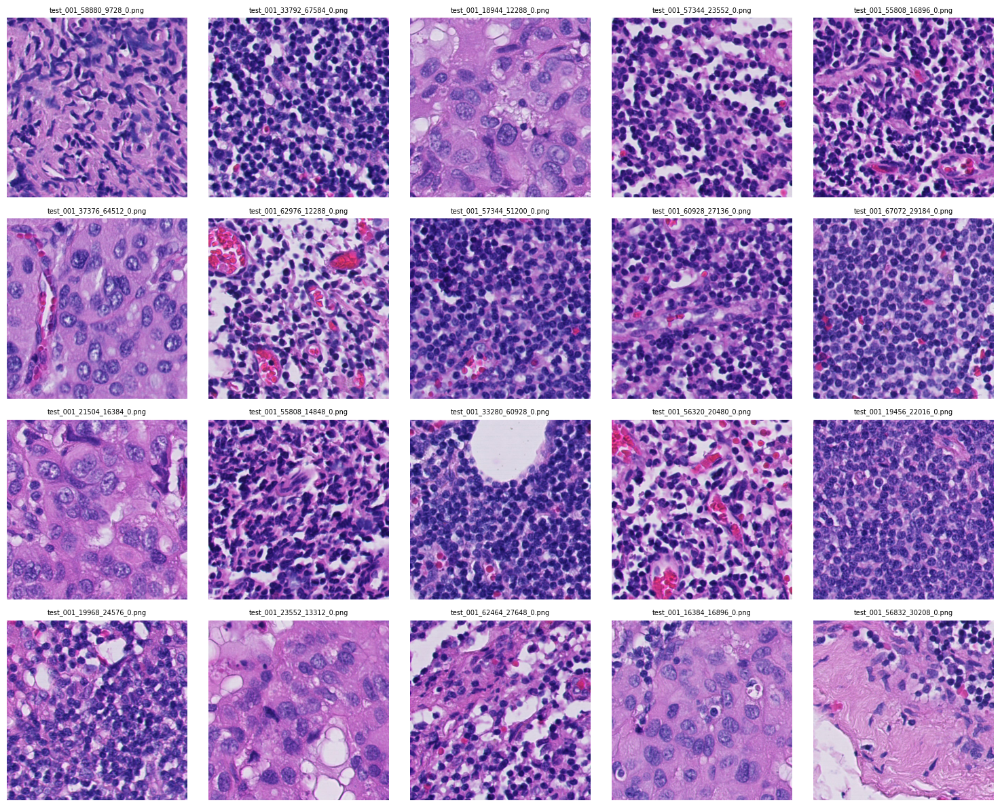

In [51]:
import os, random
from PIL import Image
import matplotlib.pyplot as plt

PATCH_DIR = "/kaggle/working/test_patches/test_001"
files = random.sample(os.listdir(PATCH_DIR), 20)

fig, axes = plt.subplots(4, 5, figsize=(15, 12))

for ax, f in zip(axes.ravel(), files):
    img = Image.open(os.path.join(PATCH_DIR, f)).convert("RGB")
    ax.imshow(img)
    ax.set_title(f, fontsize=7)
    ax.axis("off")

plt.tight_layout()
plt.show()

In [52]:
%cd /kaggle/working/ICCV2025_Ano-NAViLa

!python main.py --config configs/inference_test001.json

/kaggle/working/ICCV2025_Ano-NAViLa
/usr/local/lib/python3.12/dist-packages/timm/models/layers/__init__.py:49: FutureWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.layers", FutureWarning)
[2026-06-04 11:22:36] [INFO] Logger initialized. Log file: ./logs/251017.txt
[2026-06-04 11:22:36] [INFO] Using device: cuda:0
[2026-06-04 11:22:41] [INFO] pos embedding not resized.
Saved ./words/251017_normal_words_f.pkl                                         
Saved ./words/251017_abnormal_words_f.pkl
[2026-06-04 11:22:43] [INFO] Using VLM: CONCH
[2026-06-04 11:22:44] [INFO] Model successfully loaded from /kaggle/working/re-trained_AnoNAViLa_Model.pth
[WSI patch dataset] Total: 3130	
Testing test_001: 100%|█████████████████████████| 32/32 [03:34<00:00,  6.71s/it]
[2026-06-04 11:26:19] [INFO] Saved Ascore CSV: ./exp/251017/patch_Ascores/test_001_Ascores.csv
[2026-06-04 11:26:19]

In [19]:
# 1) fix package versions
!pip install -q "transformers==4.44.2" "tokenizers==0.19.1"

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.7/43.7 kB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.5/9.5 MB 114.6 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.6/3.6 MB 86.2 MB/s eta 0:00:00:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 566.4/566.4 kB 31.0 MB/s eta 0:00:00


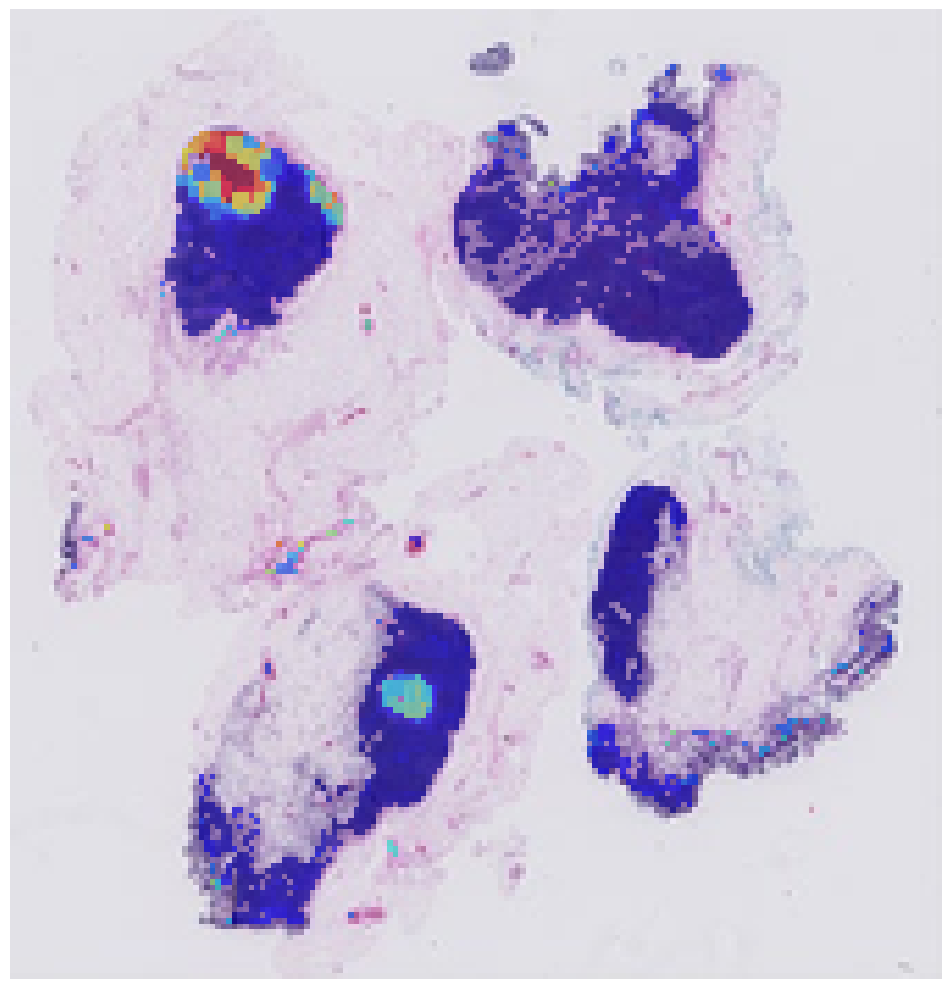

saved: /kaggle/working/test_001_anomaly_heatmap_overlay_eroded.png


In [59]:
import os
import numpy as np
import pandas as pd
import openslide
import matplotlib.pyplot as plt
from scipy.ndimage import generic_filter

WSI_PATH = "/kaggle/working/test_001.tif"
CSV_PATH = "/kaggle/working/ICCV2025_Ano-NAViLa/exp/251017/patch_Ascores/test_001_Ascores.csv"
OUT_PATH = "/kaggle/working/test_001_anomaly_heatmap_overlay_eroded.png"

slide = openslide.OpenSlide(WSI_PATH)
W, H = slide.dimensions

df = pd.read_csv(CSV_PATH)

def parse_xy(patch_name):
    name = os.path.basename(str(patch_name)).replace(".png", "")
    parts = name.split("_")
    x = int(parts[-3])
    y = int(parts[-2])
    return x, y

df["x"], df["y"] = zip(*df["patch_name"].map(parse_xy))

PATCH_SIZE = 512
DOWNSAMPLE = 512

thumb_w = W // DOWNSAMPLE
thumb_h = H // DOWNSAMPLE

heat = np.full((thumb_h, thumb_w), np.nan, dtype=np.float32)

for _, row in df.iterrows():
    x0 = int(row["x"] // DOWNSAMPLE)
    y0 = int(row["y"] // DOWNSAMPLE)
    x1 = int((row["x"] + PATCH_SIZE) // DOWNSAMPLE)
    y1 = int((row["y"] + PATCH_SIZE) // DOWNSAMPLE)

    heat[y0:y1, x0:x1] = float(row["Ascore"])

def min_if_center_exists(values):
    center = values[len(values) // 2]
    if np.isnan(center):
        return np.nan
    valid = values[~np.isnan(values)]
    return np.min(valid) if valid.size > 0 else np.nan

eroded_heat = generic_filter(
    heat,
    min_if_center_exists,
    size=(3, 3),
    mode="constant",
    cval=np.nan
)

thumb = slide.get_thumbnail((thumb_w, thumb_h)).convert("RGB")
thumb_arr = np.array(thumb)

valid = ~np.isnan(eroded_heat)
heat_norm = np.zeros_like(eroded_heat, dtype=np.float32)

if valid.any():
    vals = eroded_heat[valid]
    lo, hi = np.percentile(vals, 1), np.percentile(vals, 99)
    heat_norm[valid] = np.clip((eroded_heat[valid] - lo) / (hi - lo + 1e-8), 0, 1)

masked_heat = np.ma.masked_where(~valid, heat_norm)

plt.figure(figsize=(10, 10))
plt.imshow(thumb_arr)
plt.imshow(masked_heat, cmap="jet", alpha=0.55)
plt.axis("off")
plt.tight_layout()
plt.savefig(OUT_PATH, dpi=200, bbox_inches="tight", pad_inches=0)
plt.show()

print("saved:", OUT_PATH)

In [54]:
import pandas as pd

CSV_PATH = "/kaggle/working/ICCV2025_Ano-NAViLa/exp/251017/patch_Ascores/test_001_Ascores.csv"
OUT_TSV = "/kaggle/working/test_001_Ascores_like_github.tsv"
OUT_SORTED_TSV = "/kaggle/working/test_001_Ascores_sorted_desc.tsv"

df = pd.read_csv(CSV_PATH)

df[["patch_name", "Ascore"]].to_csv(
    OUT_TSV,
    sep="\t",
    index=False,
    header=False
)

# sorted
df_sorted = df.sort_values("Ascore", ascending=False)
df_sorted[["patch_name", "Ascore"]].to_csv(
    OUT_SORTED_TSV,
    sep="\t",
    index=False,
    header=False
)

print("saved:", OUT_TSV)
print("saved:", OUT_SORTED_TSV)

df.head(20)

saved: /kaggle/working/test_001_Ascores_like_github.tsv
saved: /kaggle/working/test_001_Ascores_sorted_desc.tsv


,patch_name,Ascore
0,test_001_23552_82944_0.png,0.000081
1,test_001_54784_20992_0.png,0.000028
2,test_001_23040_28160_0.png,0.000024
3,test_001_57344_10752_0.png,0.000084
4,test_001_33280_66560_0.png,0.000021
5,test_001_19968_15360_0.png,0.001260
6,test_001_60416_17408_0.png,0.000043
7,test_001_28160_18432_0.png,0.000349
8,test_001_26624_81920_0.png,0.000026
9,test_001_27136_22528_0.png,0.000039


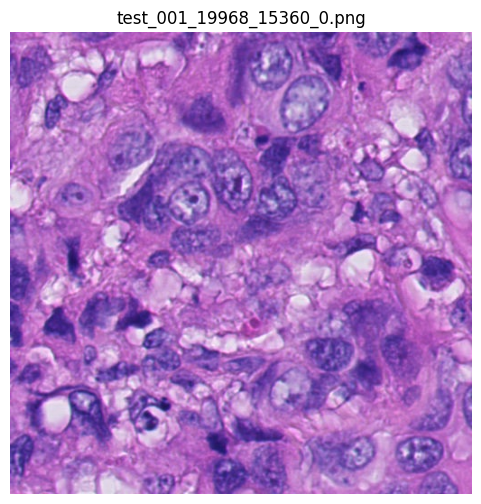

In [42]:
from PIL import Image
import matplotlib.pyplot as plt
import os

PATCH_DIR = "/kaggle/working/test_patches/test_001"

patch_name = "test_001_19968_15360_0.png"

img = Image.open(os.path.join(PATCH_DIR, patch_name))

plt.figure(figsize=(6,6))
plt.imshow(img)
plt.title(patch_name)
plt.axis("off")
plt.show()

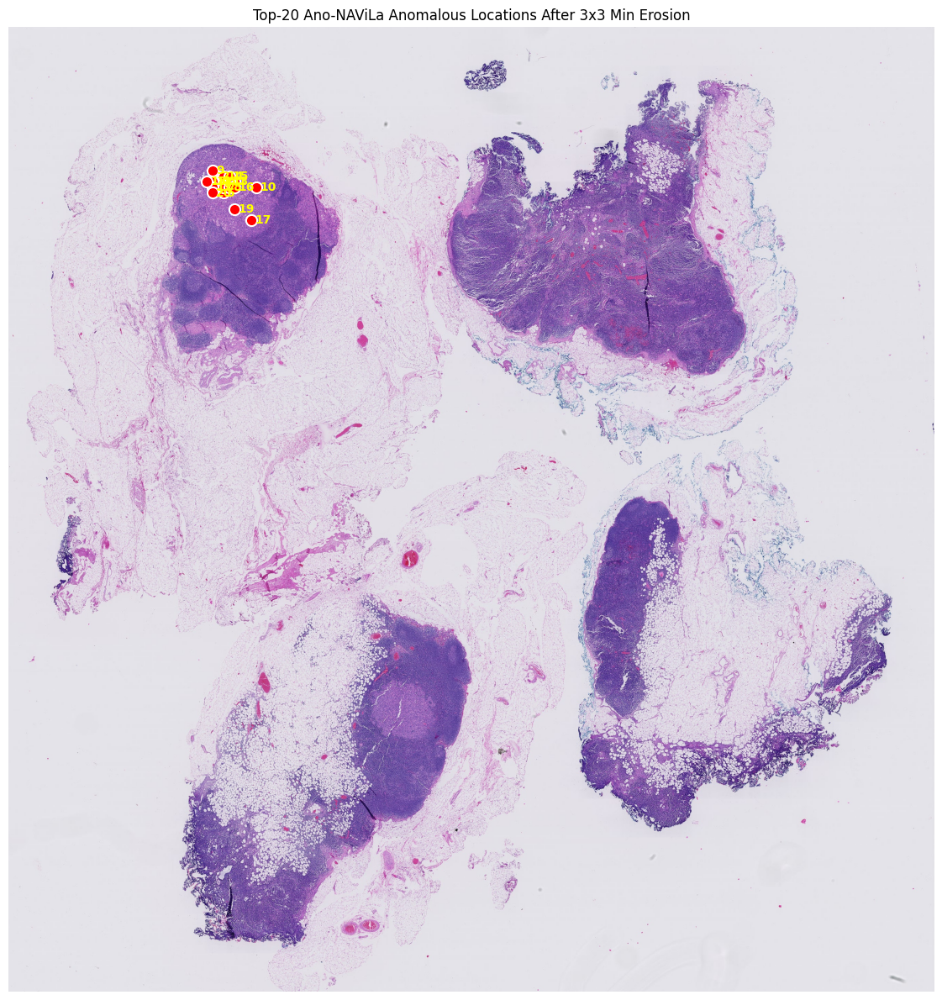

saved: /kaggle/working/test_001_top20_locations_eroded.png


,rank,eroded_Ascore,x,y
0,1,0.001424,20992,14336
1,2,0.001340,19456,13824
2,3,0.001281,19456,14848
3,4,0.001281,19456,14336
4,5,0.001260,19968,15360
5,6,0.001243,19968,14336
6,7,0.001240,19968,14848
7,8,0.001198,20480,14848
8,9,0.001168,18944,13312
9,10,0.001131,23040,14848


In [55]:
import os
import pandas as pd
import numpy as np
import openslide
import matplotlib.pyplot as plt
from scipy.ndimage import generic_filter

WSI_PATH = "/kaggle/working/test_001.tif"
CSV_PATH = "/kaggle/working/ICCV2025_Ano-NAViLa/exp/251017/patch_Ascores/test_001_Ascores.csv"
OUT_PATH = "/kaggle/working/test_001_top20_locations_eroded.png"

PATCH_SIZE = 256
DOWNSAMPLE = 256

slide = openslide.OpenSlide(WSI_PATH)
W, H = slide.dimensions

df = pd.read_csv(CSV_PATH)

def parse_xy(patch_name):
    name = os.path.basename(str(patch_name)).replace(".png", "")
    parts = name.split("_")
    x = int(parts[-3])
    y = int(parts[-2])
    return x, y

df["x"], df["y"] = zip(*df["patch_name"].map(parse_xy))

thumb_w = W // DOWNSAMPLE
thumb_h = H // DOWNSAMPLE

heat = np.full((thumb_h, thumb_w), np.nan, dtype=np.float32)

for _, row in df.iterrows():
    x0 = int(row["x"] // DOWNSAMPLE)
    y0 = int(row["y"] // DOWNSAMPLE)
    x1 = int((row["x"] + PATCH_SIZE) // DOWNSAMPLE)
    y1 = int((row["y"] + PATCH_SIZE) // DOWNSAMPLE)

    heat[y0:y1, x0:x1] = float(row["Ascore"])

def min_if_center_exists(values):
    center = values[len(values) // 2]
    if np.isnan(center):
        return np.nan
    valid = values[~np.isnan(values)]
    return np.min(valid) if valid.size > 0 else np.nan

eroded_heat = generic_filter(
    heat,
    min_if_center_exists,
    size=(3, 3),
    mode="constant",
    cval=np.nan
)

valid_positions = np.argwhere(~np.isnan(eroded_heat))
valid_scores = eroded_heat[~np.isnan(eroded_heat)]

top_idx = np.argsort(valid_scores)[::-1][:20]
top_positions = valid_positions[top_idx]
top_scores = valid_scores[top_idx]

top_eroded = pd.DataFrame({
    "rank": np.arange(1, len(top_scores) + 1),
    "eroded_Ascore": top_scores,
    "hx": top_positions[:, 1],
    "hy": top_positions[:, 0],
})

top_eroded["x"] = top_eroded["hx"] * DOWNSAMPLE
top_eroded["y"] = top_eroded["hy"] * DOWNSAMPLE

thumb = slide.get_thumbnail((2200, 2200)).convert("RGB")
thumb_arr = np.array(thumb)

scale_x = thumb_arr.shape[1] / W
scale_y = thumb_arr.shape[0] / H

top_eroded["tx"] = top_eroded["x"] * scale_x
top_eroded["ty"] = top_eroded["y"] * scale_y

plt.figure(figsize=(12, 12))
plt.imshow(thumb_arr)

plt.scatter(
    top_eroded["tx"],
    top_eroded["ty"],
    s=90,
    c="red",
    marker="o",
    edgecolors="white",
    linewidths=1.5
)

for _, row in top_eroded.iterrows():
    plt.text(
        row["tx"] + 8,
        row["ty"] + 8,
        str(int(row["rank"])),
        color="yellow",
        fontsize=10,
        weight="bold"
    )

plt.title("Top-20 Ano-NAViLa Anomalous Locations After 3x3 Min Erosion")
plt.axis("off")
plt.tight_layout()
plt.savefig(OUT_PATH, dpi=200, bbox_inches="tight", pad_inches=0)
plt.show()

print("saved:", OUT_PATH)

top_eroded[["rank", "eroded_Ascore", "x", "y"]]

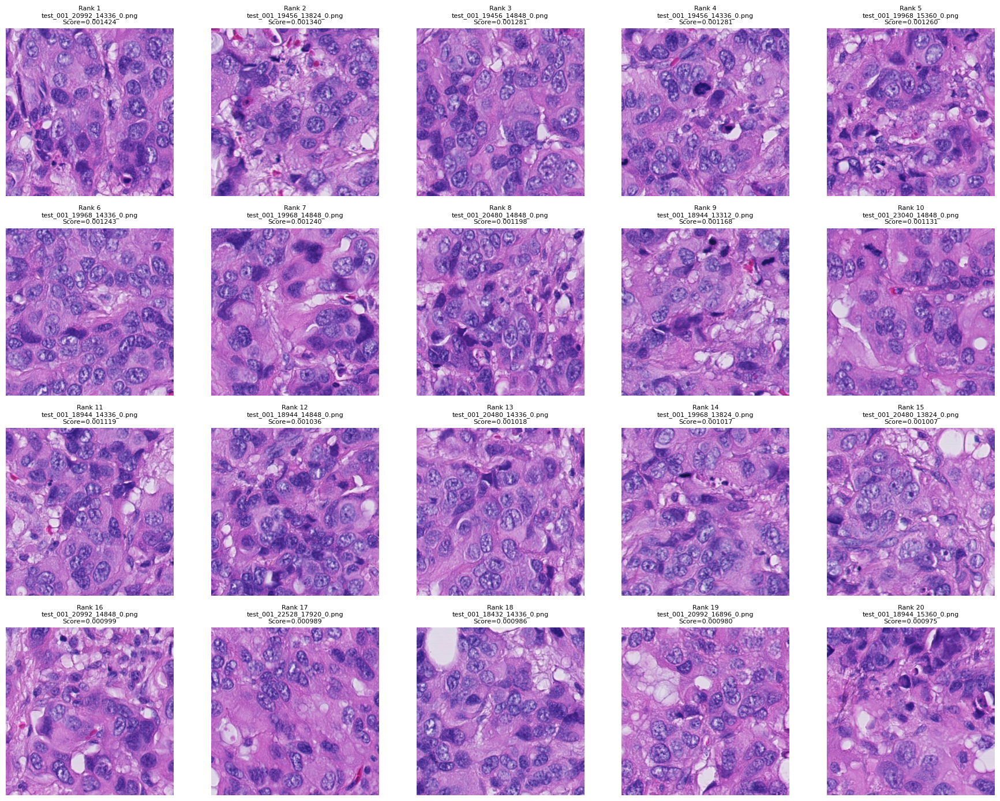

,rank,patch_name,eroded_Ascore,x,y
0,1,test_001_20992_14336_0.png,0.001424,20992,14336
1,2,test_001_19456_13824_0.png,0.001340,19456,13824
2,3,test_001_19456_14848_0.png,0.001281,19456,14848
3,4,test_001_19456_14336_0.png,0.001281,19456,14336
4,5,test_001_19968_15360_0.png,0.001260,19968,15360
5,6,test_001_19968_14336_0.png,0.001243,19968,14336
6,7,test_001_19968_14848_0.png,0.001240,19968,14848
7,8,test_001_20480_14848_0.png,0.001198,20480,14848
8,9,test_001_18944_13312_0.png,0.001168,18944,13312
9,10,test_001_23040_14848_0.png,0.001131,23040,14848


In [57]:
import os
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt

PATCH_DIR = "/kaggle/working/test_patches/test_001"

top_eroded = pd.DataFrame([
    [1, 0.001424, 20992, 14336],
    [2, 0.001340, 19456, 13824],
    [3, 0.001281, 19456, 14848],
    [4, 0.001281, 19456, 14336],
    [5, 0.001260, 19968, 15360],
    [6, 0.001243, 19968, 14336],
    [7, 0.001240, 19968, 14848],
    [8, 0.001198, 20480, 14848],
    [9, 0.001168, 18944, 13312],
    [10, 0.001131, 23040, 14848],
    [11, 0.001119, 18944, 14336],
    [12, 0.001036, 18944, 14848],
    [13, 0.001018, 20480, 14336],
    [14, 0.001017, 19968, 13824],
    [15, 0.001007, 20480, 13824],
    [16, 0.000999, 20992, 14848],
    [17, 0.000989, 22528, 17920],
    [18, 0.000986, 18432, 14336],
    [19, 0.000980, 20992, 16896],
    [20, 0.000975, 18944, 15360],
], columns=["rank", "eroded_Ascore", "x", "y"])

top_eroded["patch_name"] = top_eroded.apply(
    lambda r: f"test_001_{int(r['x'])}_{int(r['y'])}_0.png",
    axis=1
)

fig, axes = plt.subplots(4, 5, figsize=(18, 14))

for ax, (_, row) in zip(axes.ravel(), top_eroded.iterrows()):
    patch_path = os.path.join(PATCH_DIR, row["patch_name"])

    if os.path.exists(patch_path):
        img = Image.open(patch_path).convert("RGB")
        ax.imshow(img)
        ax.set_title(
            f"Rank {int(row['rank'])}\n{row['patch_name']}\nScore={row['eroded_Ascore']:.6f}",
            fontsize=8
        )
    else:
        ax.text(
            0.5,
            0.5,
            f"Missing:\n{row['patch_name']}",
            ha="center",
            va="center"
        )

    ax.axis("off")

plt.tight_layout()
plt.show()

top_eroded[["rank", "patch_name", "eroded_Ascore", "x", "y"]]

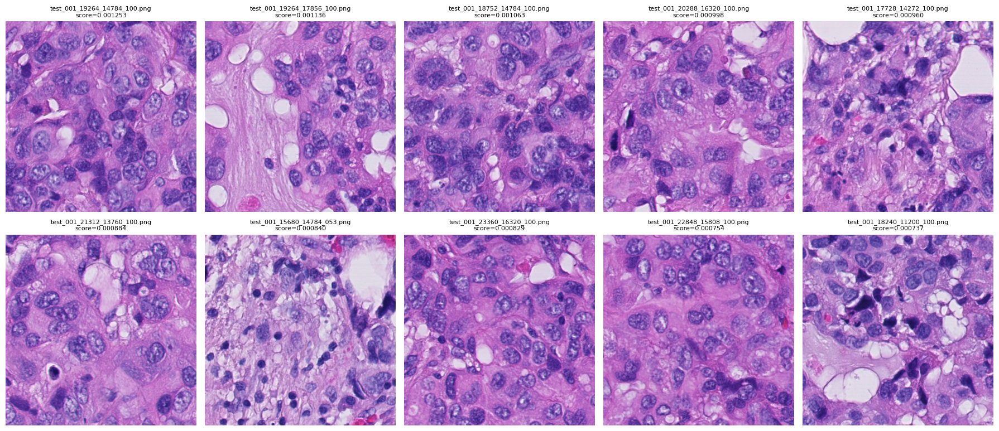

In [45]:
import openslide
from PIL import Image
import matplotlib.pyplot as plt

WSI_PATH = "/kaggle/working/test_001.tif"
slide = openslide.OpenSlide(WSI_PATH)

PATCH_SIZE = 512

github_top10 = [
    ("test_001_19264_14784_100.png", 0.0012528896331787),
    ("test_001_19264_17856_100.png", 0.0011364817619323),
    ("test_001_18752_14784_100.png", 0.0010627508163452),
    ("test_001_20288_16320_100.png", 0.0009982585906982),
    ("test_001_17728_14272_100.png", 0.0009599924087524),
    ("test_001_21312_13760_100.png", 0.0008839368820190),
    ("test_001_15680_14784_053.png", 0.0008397698402404),
    ("test_001_23360_16320_100.png", 0.0008289813995361),
    ("test_001_22848_15808_100.png", 0.0007536411285400),
    ("test_001_18240_11200_100.png", 0.0007370710372924),
]

def parse_xy_from_github_name(patch_name):
    name = patch_name.replace(".png", "")
    parts = name.split("_")
    x = int(parts[-3])
    y = int(parts[-2])
    return x, y

fig, axes = plt.subplots(2, 5, figsize=(18, 8))

for ax, (patch_name, score) in zip(axes.ravel(), github_top10):
    x, y = parse_xy_from_github_name(patch_name)

    patch = slide.read_region(
        (x, y),
        0,
        (PATCH_SIZE, PATCH_SIZE)
    ).convert("RGB")

    ax.imshow(patch)
    ax.set_title(
        f"{patch_name}\nscore={score:.6f}",
        fontsize=8
    )
    ax.axis("off")

plt.tight_layout()
plt.show()